In [ ]:
#Real time pitch shifter
"""
Implementacion del algotirmo de pitch shifting utilizado en https://www.eeweb.com/real-time-fpga-pitch-shifter/

"""
#Time domain pitch shifting.
#Consists of doing the following:

"""
   1. Zero pad the original audio.
   2. Time-Stretch the audio to a factor (A)
   3. Resample the Time-Strechted audio to a factor 1/A
   4. Profit (?)

"""
import numpy as np
import matplotlib.pyplot as plot
from scipy.io import wavfile

#wget https://file.io/hqTNHSr2RZnS -o clip.wav


In [ ]:
#funciones:
def dibujar(x,y):
  #dibujamos la senoidal.
  plot.plot(x,y)
  plot.title('Seno')
  plot.xlabel('Tiempo')
  plot.ylabel('Amplitud')
  plot.grid(True, which='both')
  plot.axhline(y=0, color='k')
  plot.xscale("linear")
  plot.xlim(0,2)
  # mostrar la grafica.
  plot.show()


def dibujar(x,y, xlimit ):
  #dibujamos la senoidal.
  plot.plot(x,y)
  #plot.title('Seno')
  plot.xlabel('Tiempo')
  plot.ylabel('Amplitud')
  plot.grid(True, which='both')
  #plot.axhline(y=0, color='k')
  plot.xscale("linear")
  plot.xlim(0, xlimit)
  plot.show()

def dibujar(x,y, leftlimit, rightlimit ):
  #dibujamos la senoidal.
  plot.plot(x,y)
  #plot.title('Seno')
  plot.xlabel('Tiempo')
  plot.ylabel('Amplitud')
  plot.grid(True, which='both')
  #plot.axhline(y=0, color='k')
  plot.xscale("linear")
  plot.xlim(leftlimit, rightlimit)
  plot.show()


In [ ]:
from IPython.display import Audio, display
import numpy as np
#Muestra de audio original.
sample_rate, data = wavfile.read('/content/clip.wav')
duration = 7.97089 #Duracion del archivo original de audio.
time = np.arange(0, duration, 1/sample_rate)
silence = np.zeros(sample_rate*int(duration))
data_og = np.hstack((data, silence)) # Señal de audio con Zero-padding a la izquierda.


audio = Audio(data_og, rate=sample_rate, autoplay=False)
display(audio)



In [ ]:
#Time Stretching
time = np.arange(0, duration*2, 1/sample_rate)
data_strech = np.hstack((data,data))


audio_strech = Audio(data_strech, rate=sample_rate, autoplay=False)
display(audio_strech)



In [ ]:
# Vamos a incrementar el pitch sampleado la mitad de las muestras.
upshift = []
dataList = data_strech.tolist()
size = len(dataList)

for sample in range(0, size ):
  if sample % 2 == 0:
    upshift.append( dataList[sample]  )

data_up = np.asarray(upshift)


silence = np.zeros(sample_rate*int(duration))
data_up = np.hstack((data_up, silence))
audio_up= Audio(data_up, rate=sample_rate*1, autoplay=False)
display(audio_up)


## Comparación y Resultados

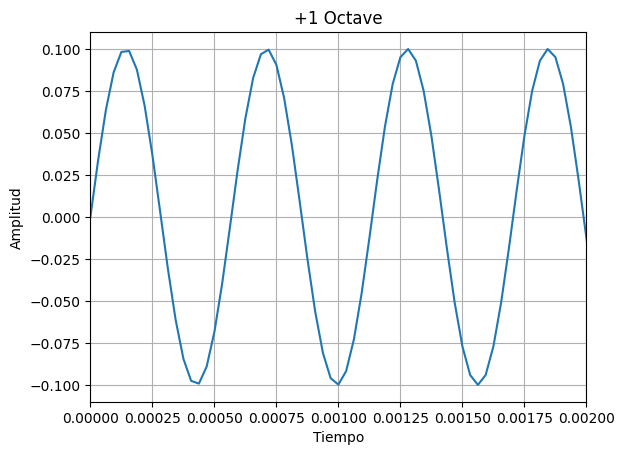

In [ ]:

time = np.arange(0, duration, 1/32000)

plot.title("+1 Octave")
dibujar(time, data_up, 0.002)
display(audio_up)




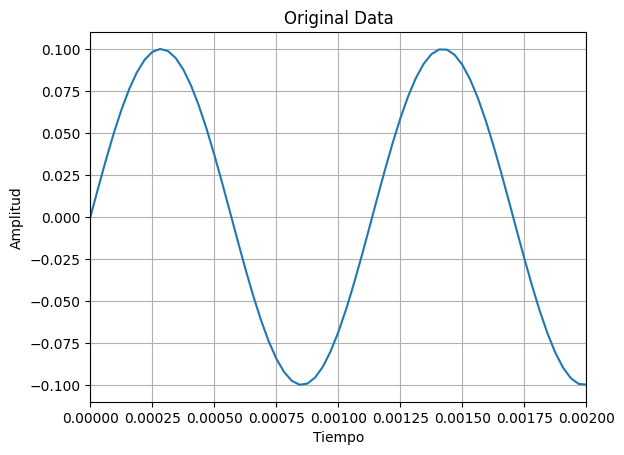

In [ ]:
plot.title("Original Data")
dibujar(time, data_og, 0.002)
display(audio)

## Algoritmo (?)


In [11]:
#Simplified Synchronous Overlap and Add
def SSOLA(data,octaves):
  #Time Stretching
  data_strech = np.hstack((data,data))
  data_strech = data_strech * np.hamming(len(data_strech))
  audio_strech = Audio(data_strech, rate=sample_rate, autoplay=False)
  #Reesampling:
  upshift = []
  dataList = data_strech.tolist()
  size = len(dataList)
  for sample in range(0, size ):
    if sample % octaves == 0:
     upshift.append( dataList[sample]  )

  return upshift


def pitchShift(data, buffSize, octaves):
  buffer = []
  output = []
  rounds = len(data) / buffSize
  print(buffSize)
  sample_offset = 0

  for i in range(0, int(rounds)):
   #Fill buffer
    for sample_index in range(0, buffSize):
      buffer.append(data[sample_index + sample_offset])

    buffer = SSOLA(buffer,octaves)
    sample_offset += buffSize
    output.extend(buffer)

    buffer.clear()

  data_up = np.asarray(output)
  data_up = np.hstack((data_up, silence))
  audio_up= Audio(data_up, rate=sample_rate*1, autoplay=False)
  #return data_up
  display(audio_up)
  return data_up










In [ ]:

 #pitchShift(data, 2048, 2)
pitchShift(data, 3072, 2)


3072


### Resultados y Comparacion

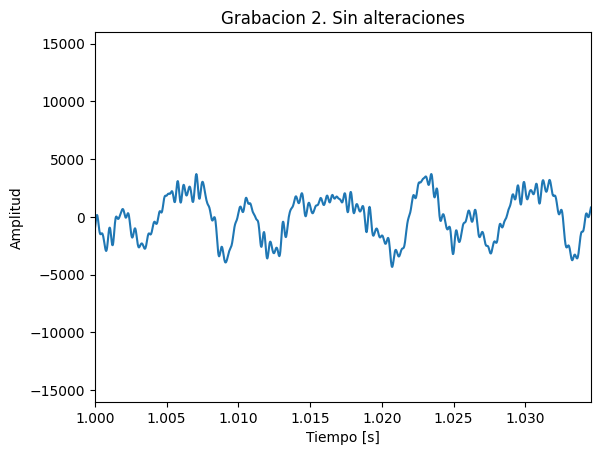

4296


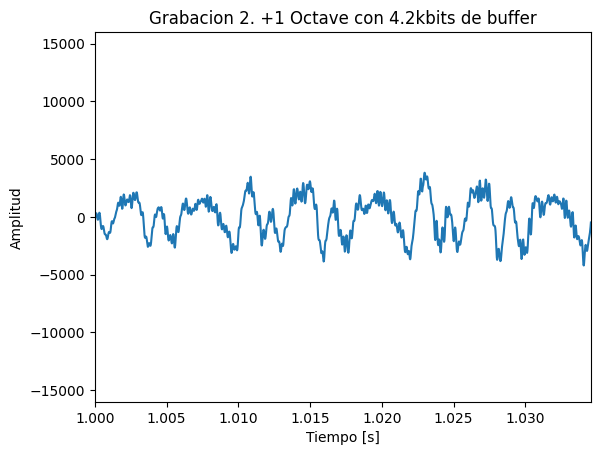

In [34]:
import numpy as np
import matplotlib.pyplot as plot
from scipy.io import wavfile
from IPython.display import Audio, display
import numpy as np

#Muestra de audio original.
sample_rate, data = wavfile.read('./audios/masterofpuppets-mono.wav')

#Duracion del archivo original de audio.
duration = 5.0
time = np.arange(0, duration, 1/sample_rate)
silence = np.zeros(sample_rate*int(duration))

#Reproduccion de audio original.
display(Audio(data, rate=sample_rate, autoplay=False))

#Dibujar la señal de audio original.
plot.plot(time, data[:len(time)])

#Ajustar escala en X\
plot.xlim(1, 1.03455)
plot.ylim(-16000,16000)
plot.xlabel('Tiempo [s]')
plot.ylabel('Amplitud')
plot.title('Grabacion 2. Sin alteraciones') 
plot.show()

#Aplicando pitch shift

data = pitchShift(data, 4296, 2)

#Dibujar Pitch Shift
plot.plot(time, data[:len(time)], color = 'green')
#Ajustar escala en X\
plot.xlim(1, 1.03455)
plot.ylim(-16000,16000)
plot.xlabel('Tiempo [s]')
plot.ylabel('Amplitud')
plot.title('Grabacion 2. +1 Octave con 4.2kbits de buffer') 
plot.show()





